# New York City TLC Trip Record
**Created by:** Christian\
**Class Code** JCDS2904\
NYC TLC Trip Record,available for download at <a href="https://drive.google.com/drive/folders/1NYHIL-RgVPW-HONz4pdzlcbIChF-c37N">this Google Drive link</a>.

# 📘 Project Overview:NYC Taxi Trip Analysis
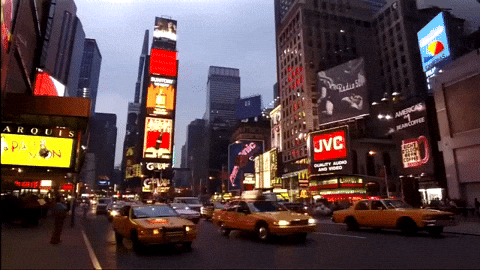

**👥 Stakeholders**
- **Taxi service operators** — responsible for managing fleets and maximizing revenue.
- **City transportation managers** — interested in traffic,congestion,and service efficiency.
- **Pricing and strategy teams** — focused on optimizing fare structures and customer satisfaction.

**❓ Problem Statement**
> The company lacks insights into when and where taxi operations are most profitable. There is also limited understanding of what factors most influence total earnings and tips. This hampers the ability to make informed operational,pricing,and staffing decisions.

**🎯 Goal**
> To uncover patterns in time,location,and trip characteristics that significantly impact total earnings and tips. This analysis aims to deliver actionable recommendations that can improve operational efficiency,optimize resource allocation,and enhance revenue.

# Import Libraries

In [4]:
import numpy as np
import pandas as pd
from datetime import datetime
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.express as px
import warnings

pd.set_option("display.max_rows",500)
warnings.filterwarnings("ignore")

# Data
1. Read Dataset
2. Data Profiling
3. Data Cleansing
4. Data Transformation

## 1. Read Dataset

---
**🚕 Feature Descriptions**

1. `VendorID`
A code indicating the LPEP (Licensed Technology Service Provider) that provided the record:
- `1`:Creative Mobile Technologies,LLC.
- `2`:VeriFone Inc.

2. `lpep_pickup_datetime`
The date and time when the meter was engaged.

3. `lpep_dropoff_datetime`
The date and time when the meter was disengaged.

4. `store_and_fwd_flag`
Indicates whether the trip record was held in vehicle memory before sending to the vendor (store and forward):
- `Y`:Store and forward trip (no connection at the time).
- `N`:Not a store and forward trip.

5. `RateCodeID`
Final rate code in effect at the end of the trip:
- `1`:Standard rate
- `2`:JFK
- `3`:Newark
- `4`:Nassau or Westchester
- `5`:Negotiated fare
- `6`:Group ride([Reddit][1],[Socrata Developers][2],[Cran][3])

6. `PULocationID`
TLC Taxi Zone where the meter was engaged (pickup location).([Welcome to NYC.gov | City of New York][4])

7. `DOLocationID`
TLC Taxi Zone where the meter was disengaged (drop-off location).

8. `Passenger_count`
Number of passengers in the vehicle (driver-entered).

9. `trip_distance`
Elapsed trip distance in miles reported by the taximeter.

10. `fare_amount`
Time-and-distance fare calculated by the meter.

11. `extra`
Additional charges:
- \$0.50 for trips between 8 PM and 6 AM (night surcharge).
- \$1.00 for trips on weekdays between 4 PM and 8 PM (peak hour surcharge).

12. `mta_tax`
\$0.50 MTA tax automatically triggered based on the metered rate in use.

13. `tip_amount`
Tip amount paid by passengers; this field is automatically populated for credit card tips. Cash tips are not included.

14. `tolls_amount`
Total amount of all tolls paid during the trip.

15. `ehail_fee`
This field was included for potential e-hail fees (e.g.,fees associated with app-based hailing services). However,it is typically null or not populated in the dataset.

16. `improvement_surcharge`
\$0.30 improvement surcharge assessed on hailed trips at the flag drop. This surcharge began being levied in 2015.

17. `total_amount`
Total amount charged to passengers. This includes fare amount,extra charges,MTA tax,tip amount,tolls amount,improvement surcharge,and congestion surcharge. It does not include cash tips.

18. `trip_type`
A code indicating whether the trip was a street hail or a dispatch:

- `1`:Street-hail
- `2`:Dispatch

19. `congestion_surcharge`
A surcharge imposed on trips that begin,end,or pass through Manhattan south of 96th Street (the congestion zone):
- \$2.50 for non-shared trips in taxicabs
- \$2.75 for non-shared trips in for-hire vehicles (including green taxis)
- \$0.75 for shared rides([NYC311][5],[Welcome to NYC.gov | City of New York][6],[Limo Anywhere][7])
---

In [8]:
df=pd.read_csv("input/NYC TLC Trip Record.csv")

display(
    df.sample(5)
)

,VendorID,lpep_pickup_datetime,lpep_dropoff_datetime,store_and_fwd_flag,RatecodeID,PULocationID,DOLocationID,passenger_count,trip_distance,fare_amount,extra,mta_tax,tip_amount,tolls_amount,ehail_fee,improvement_surcharge,total_amount,payment_type,trip_type,congestion_surcharge
31729,2,2023-01-17 06:58:58,2023-01-17 07:05:18,N,1.0,74,75,1.0,1.39,8.6,0.00,0.5,0.00,0.0,NaN,1.0,10.1,2.0,1.0,0.00
46828,2,2023-01-24 08:01:17,2023-01-24 08:02:37,N,1.0,82,129,1.0,0.05,3.7,0.00,0.5,0.00,0.0,NaN,1.0,5.2,2.0,1.0,0.00
43991,2,2023-01-22 19:50:04,2023-01-22 20:03:43,N,1.0,97,61,1.0,2.25,14.2,0.00,0.5,0.00,0.0,NaN,1.0,15.7,2.0,1.0,0.00
4695,2,2023-01-03 22:19:32,2023-01-03 22:34:49,N,1.0,260,193,2.0,3.16,17.0,1.00,0.5,3.90,0.0,NaN,1.0,23.4,1.0,1.0,0.00
46343,1,2023-01-23 20:10:29,2023-01-23 20:21:29,N,1.0,75,142,1.0,2.60,14.2,3.75,1.5,3.85,0.0,NaN,1.0,23.3,1.0,1.0,2.75


---
**🚕 Feature Descriptions**

1. `LocationID` A unique numeric code representing a specific pickup or dropoff area.

2. `Borough` The larger administrative division where the location is situated (e.g., Manhattan, Queens).

3. `Zone` A more detailed neighborhood or district name within the borough.

4. `service_zone` Categorizes the location by operational area, such as Yellow Zone, Green Zone, or Airport.

---

In [10]:
zone=pd.read_csv("input/NYC TLC Zone.csv")

# Gabung dengan data pickup zone
df=pd.merge(df,zone[["LocationID","Borough"]],how="left",left_on="PULocationID",right_on="LocationID")
df=df.rename(columns={"Borough":"pickup_location"})
df=df.drop(["LocationID","PULocationID"],axis=1)

# Gabung dengan data dropoff zone
df=pd.merge(df,zone[["LocationID","Borough"]],how="left",left_on="DOLocationID",right_on="LocationID")
df=df.rename(columns={"Borough":"dropoff_location"})
df=df.drop(["LocationID","DOLocationID"],axis=1)

## 2. Data profiling
**Result:**
1. Change `lpep_pickup_datetime` and `lpep_dropoff_datetime` type ⟶ `Datetime64`
2. Missing Data at `RateCodeID`,`passenger_count`,`payment_type`,`trip_type`,and `congestion_surcharge`
3. Remove `ehail_fee` entirely data missing
4. Mapping:`VendorID`,`store_and_fwd_flag`,`RateCodeID`,and `trip_type`
5. Filter:
   - `fare_amount` min=\$ -70.00
   - `extra` min=\$ -2,50
   - `mta_tax` min=\$ -0.50
   - `tip_amount` min=\$ -10.50
   - `improvement_surcharge` min=\$ -1.00
   - `total_amount` min=\$ -71.50
   - `congestion_surcharge` min=\$ -2.75
6. Outlier:`trip_distance` > 1500
7. Correlation:
   - `fare_ammount` and `total_amount`=0.97
   - `tip_amount` and `total_amount`=0.51
   - `tolls_amount` and `total_amount`=0.41
   - `fare_amount` and `tip_ammount`=0.31

In [12]:
df.head()

,VendorID,lpep_pickup_datetime,lpep_dropoff_datetime,store_and_fwd_flag,RatecodeID,passenger_count,trip_distance,fare_amount,extra,mta_tax,tip_amount,tolls_amount,ehail_fee,improvement_surcharge,total_amount,payment_type,trip_type,congestion_surcharge,pickup_location,dropoff_location
0,2,2023-01-01 00:26:10,2023-01-01 00:37:11,N,1.0,1.0,2.58,14.9,1.0,0.5,4.03,0.0,NaN,1.0,24.18,1.0,1.0,2.75,Manhattan,Manhattan
1,2,2023-01-01 00:51:03,2023-01-01 00:57:49,N,1.0,1.0,1.81,10.7,1.0,0.5,2.64,0.0,NaN,1.0,15.84,1.0,1.0,0.00,Manhattan,Manhattan
2,2,2023-01-01 00:35:12,2023-01-01 00:41:32,N,1.0,1.0,0.00,7.2,1.0,0.5,1.94,0.0,NaN,1.0,11.64,1.0,1.0,0.00,Queens,Queens
3,1,2023-01-01 00:13:14,2023-01-01 00:19:03,N,1.0,1.0,1.30,6.5,0.5,1.5,1.70,0.0,NaN,1.0,10.20,1.0,1.0,0.00,Manhattan,Manhattan
4,1,2023-01-01 00:33:04,2023-01-01 00:39:02,N,1.0,1.0,1.10,6.0,0.5,1.5,0.00,0.0,NaN,1.0,8.00,1.0,1.0,0.00,Manhattan,Manhattan


In [13]:
dtype=pd.DataFrame(df.dtypes).rename(
    columns={
        0:"Data Type"
    }
)

value=pd.DataFrame(df.head(1)).T.rename(
    columns={
        0:"Value"
    }
)

dtype.join(value)

,Data Type,Value
VendorID,int64,2
lpep_pickup_datetime,object,2023-01-01 00:26:10
lpep_dropoff_datetime,object,2023-01-01 00:37:11
store_and_fwd_flag,object,N
RatecodeID,float64,1.0
passenger_count,float64,1.0
trip_distance,float64,2.58
fare_amount,float64,14.9
extra,float64,1.0
mta_tax,float64,0.5


In [14]:
df.describe()

,VendorID,RatecodeID,passenger_count,trip_distance,fare_amount,extra,mta_tax,tip_amount,tolls_amount,ehail_fee,improvement_surcharge,total_amount,payment_type,trip_type,congestion_surcharge
count,68211.000000,63887.000000,63887.000000,68211.000000,68211.000000,68211.000000,68211.000000,68211.000000,68211.000000,0.0,68211.000000,68211.000000,63887.000000,63877.000000,63887.000000
mean,1.863028,1.117160,1.315870,8.114852,16.603545,0.825431,0.588340,2.139012,0.169627,NaN,0.951625,21.789377,1.373613,1.021933,0.726748
std,0.343820,1.372913,0.979054,585.105955,13.470121,1.269904,0.385819,3.052710,1.099789,NaN,0.196875,15.457115,0.508039,0.146465,1.212836
min,1.000000,1.000000,0.000000,0.000000,-70.000000,-2.500000,-0.500000,-10.500000,0.000000,NaN,-1.000000,-71.500000,1.000000,1.000000,-2.750000
25%,2.000000,1.000000,1.000000,1.110000,9.300000,0.000000,0.500000,0.000000,0.000000,NaN,1.000000,12.900000,1.000000,1.000000,0.000000
50%,2.000000,1.000000,1.000000,1.850000,13.500000,0.000000,0.500000,1.600000,0.000000,NaN,1.000000,17.900000,1.000000,1.000000,0.000000
75%,2.000000,1.000000,1.000000,3.210000,19.800000,1.000000,0.500000,3.330000,0.000000,NaN,1.000000,26.150000,2.000000,1.000000,2.750000
max,2.000000,99.000000,9.000000,120098.840000,490.000000,12.500000,2.750000,222.220000,36.050000,NaN,1.000000,491.000000,5.000000,2.000000,2.750000


In [15]:
pd.DataFrame(df.nunique()).rename(columns={0:"Unique Value"})

,Unique Value
VendorID,2
lpep_pickup_datetime,66575
lpep_dropoff_datetime,66519
store_and_fwd_flag,2
RatecodeID,6
passenger_count,10
trip_distance,1870
fare_amount,2553
extra,16
mta_tax,6


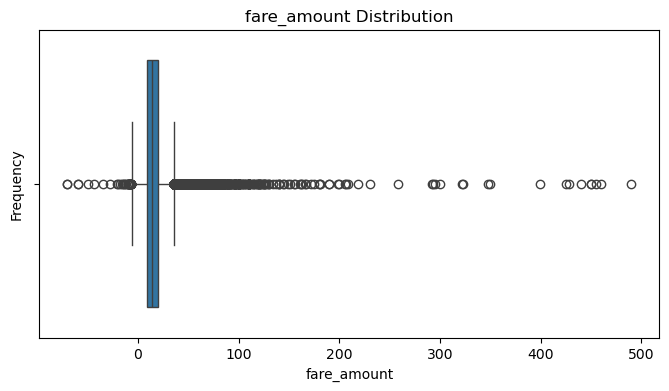

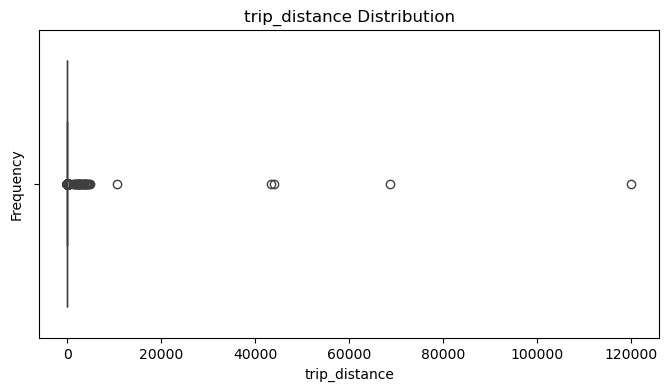

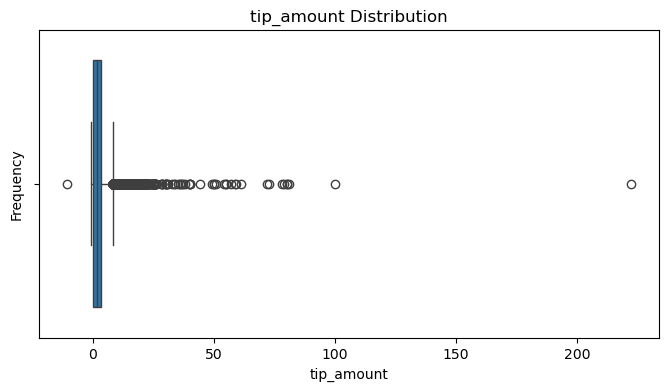

In [16]:
cols=[
    "fare_amount",
    "trip_distance",
    "tip_amount"
]

for col in cols:
    plt.figure(figsize=(8,4))
    sns.boxplot(x=df[col])
    plt.title(f"{col} Distribution")
    plt.xlabel(col)
    plt.ylabel("Frequency")
    plt.show()

In [17]:
check_corr=df.drop(columns=[
    "lpep_pickup_datetime",
    "lpep_dropoff_datetime",
    "store_and_fwd_flag",
    "pickup_location",
    "dropoff_location"
])

check_corr.corr()

,VendorID,RatecodeID,passenger_count,trip_distance,fare_amount,extra,mta_tax,tip_amount,tolls_amount,ehail_fee,improvement_surcharge,total_amount,payment_type,trip_type,congestion_surcharge
VendorID,1.000000,-0.008287,0.084265,0.004002,0.006724,-0.136073,-0.908011,0.061815,-0.017384,NaN,-0.071401,0.019674,0.007002,0.042880,0.009523
RatecodeID,-0.008287,1.000000,-0.004009,0.026716,0.097378,-0.048503,-0.090009,0.006248,0.022052,NaN,-0.036233,0.078795,-0.019782,0.936312,-0.038727
passenger_count,0.084265,-0.004009,1.000000,0.007186,0.013237,-0.006019,-0.079977,0.026053,0.003623,NaN,0.027175,0.019824,-0.014177,-0.001703,0.023339
trip_distance,0.004002,0.026716,0.007186,1.000000,0.012833,-0.005774,-0.014687,0.003216,0.000808,NaN,-0.001646,0.011702,-0.013694,-0.001135,0.084841
fare_amount,0.006724,0.097378,0.013237,0.012833,1.000000,-0.003625,-0.074420,0.313688,0.335509,NaN,0.069489,0.967764,-0.052622,0.157503,0.149941
extra,-0.136073,-0.048503,-0.006019,-0.005774,-0.003625,1.000000,0.200986,0.101623,0.062253,NaN,0.078139,0.100460,-0.085146,-0.087019,0.091409
mta_tax,-0.908011,-0.090009,-0.079977,-0.014687,-0.074420,0.200986,1.000000,-0.091542,-0.020641,NaN,0.154879,-0.075833,-0.028368,-0.253546,0.012407
tip_amount,0.061815,0.006248,0.026053,0.003216,0.313688,0.101623,-0.091542,1.000000,0.196708,NaN,0.026255,0.511460,-0.500553,0.019974,0.265940
tolls_amount,-0.017384,0.022052,0.003623,0.000808,0.335509,0.062253,-0.020641,0.196708,1.000000,NaN,0.014620,0.405128,-0.039489,0.010011,-0.036060
ehail_fee,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


## 3. Data Cleansing
1. Handle Missing Values
2. Remove Duplicates
3. Remove Invalid Values
4. Remove Outliers

### Handle Missing Values

In [20]:
check_missing=pd.DataFrame(round(
    df.isna().sum()/len(df)*100,2
).astype(str)+"%").rename(
    columns={
        0:"Missing Value"
    }
)

check_missing[check_missing["Missing Value"]!="0.0%"]

,Missing Value
store_and_fwd_flag,6.34%
RatecodeID,6.34%
passenger_count,6.34%
ehail_fee,100.0%
payment_type,6.34%
trip_type,6.35%
congestion_surcharge,6.34%


<div class="alert alert-danger">Dropping the rows,since they represent only 6.35% of the total data.</div>

In [22]:
print("Before drop missing value:",len(df))
df=df.drop(columns=["ehail_fee"]).dropna()
print("After drop missing value:",len(df))

Before drop missing value: 68211
After drop missing value: 63877


### Remove Duplicates

In [24]:
pd.DataFrame(df.duplicated().value_counts())

,count
False,63877


<div class="alert alert-success">Never mind,there are no duplicates</div>

### Remove Invalid Values

In [27]:
check_invalid=df[[
    "fare_amount",
    "extra",
    "mta_tax",
    "tip_amount",
    "improvement_surcharge",
    "total_amount",
    "congestion_surcharge",
    "trip_distance"
]].copy()

check_invalid=pd.DataFrame(round(
    (check_invalid < 0).sum()/len(check_invalid)*100,2
).astype(str)+"%").rename(
    columns={
        0:"Invalid Value"
    }
)

check_invalid.iloc[7]=round((df["trip_distance"]<0.61).sum()/len(df)*100,2).astype(str)+"%"

check_invalid[check_invalid["Invalid Value"]!="0.0%"]

,Invalid Value
fare_amount,0.27%
extra,0.13%
mta_tax,0.26%
tip_amount,0.01%
improvement_surcharge,0.27%
total_amount,0.27%
trip_distance,10.39%


<div class="alert alert-danger">Dropping the rows,since they represent only 0.27% of the total data,and dropping 10.39% of the rows where trip_distance is below 1 KM.</div>

In [29]:
print("Before drop invalid value:",len(df))
df=df[df["fare_amount"]>=0]
df=df[df["extra"]>=0]
df=df[df["mta_tax"]>=0]
df=df[df["tip_amount"]>=0]
df=df[df["improvement_surcharge"]>=0]
df=df[df["total_amount"]>=0]
df=df[df["congestion_surcharge"]>=0]
df=df[df["trip_distance"]>=0.62]
print("After drop invalid value:",len(df))

Before drop invalid value: 63877
After drop invalid value: 57102


### Remove Outliers
- `fare_amount` > 200
- `trip_distance` > 200
- `tip_amount` > 50

In [31]:
outlier=[
    ["fare_amount",200],
    ["trip_distance",200],
    ["tip_amount",50]
]

check_outlier=[]

for col in outlier:
    percentage=round((df[col[0]]>col[1]).sum()/len(df)*100,3).astype(str)+"%"
    check_outlier.append([col[0],percentage])

pd.DataFrame(check_outlier,columns=["","Outlier Value"]).set_index("")

,Outlier Value
,
fare_amount,0.019%
trip_distance,0.002%
tip_amount,0.023%


<div class="alert alert-danger">Dropping the row,with outlier value.</div>

Before drop outlier value: 57102
After drop invalid value: 57075


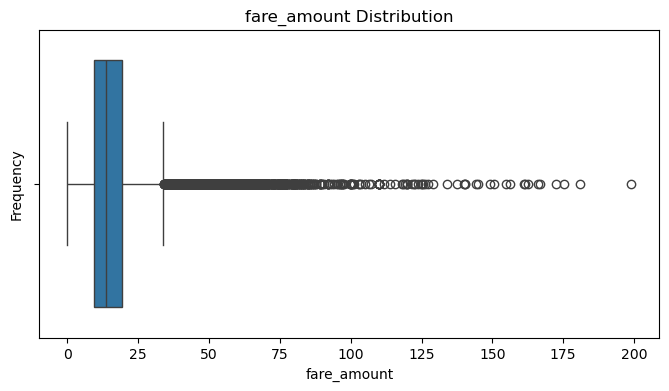

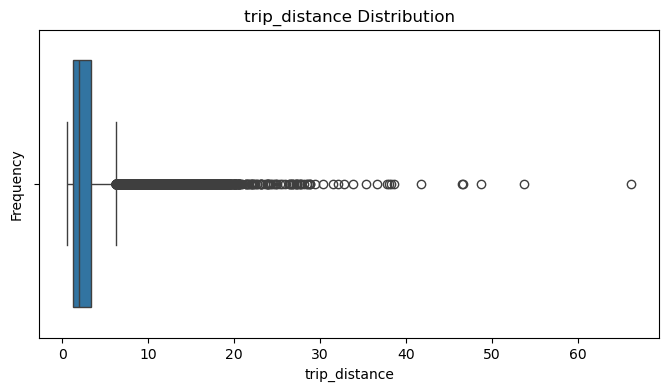

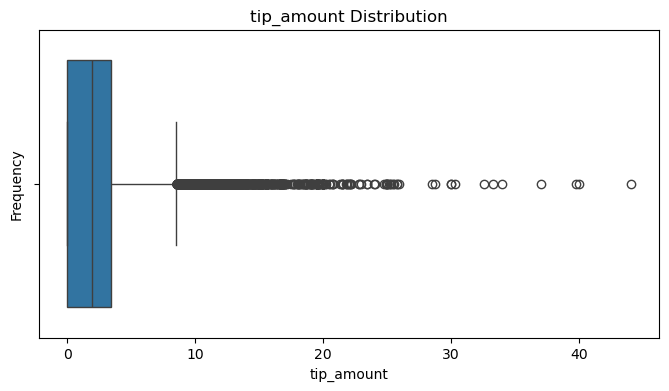

In [33]:
print("Before drop outlier value:",len(df))

for col in outlier:
    df=df[df[col[0]]<col[1]]

print("After drop invalid value:",len(df))
for col in cols:
    plt.figure(figsize=(8,4))
    sns.boxplot(x=df[col])
    plt.title(f"{col} Distribution")
    plt.xlabel(col)
    plt.ylabel("Frequency")
    plt.show()

## 4. Data Transformation
- Covert Data Types
- Create Columns
- Value Mapping

### Convert Data Types

In [36]:
df["lpep_pickup_datetime"]=pd.to_datetime(df["lpep_pickup_datetime"],infer_datetime_format=True)
df["lpep_dropoff_datetime"]=pd.to_datetime(df["lpep_dropoff_datetime"],infer_datetime_format=True)
pd.DataFrame(df.dtypes).rename(columns={0:"Data Type"})

,Data Type
VendorID,int64
lpep_pickup_datetime,datetime64[ns]
lpep_dropoff_datetime,datetime64[ns]
store_and_fwd_flag,object
RatecodeID,float64
passenger_count,float64
trip_distance,float64
fare_amount,float64
extra,float64
mta_tax,float64


In [37]:
df[[
    "lpep_pickup_datetime",
    "lpep_dropoff_datetime"
]].describe()

,lpep_pickup_datetime,lpep_dropoff_datetime
count,57075,57075
mean,2023-01-16 20:39:55.914253056,2023-01-16 20:58:23.057993728
min,2009-01-01 20:21:27,2009-01-02 11:07:31
25%,2023-01-09 12:32:29,2023-01-09 12:45:06.500000
50%,2023-01-17 09:08:08,2023-01-17 09:24:27
75%,2023-01-24 16:28:10.500000,2023-01-24 16:45:18.500000
max,2023-02-01 03:10:05,2023-02-01 17:27:05


### Value Mapping

1. `VendorID`
- `1` ⟶ Creative Mobile Technologies,LLC.
- `2` ⟶ VeriFone Inc.

2. `TripType`
- `Y`⟶ Store and forward trip
- `N`⟶ Not a store and forward trip

3. `RateCodeID`
- `1`⟶ Standard rate
- `2`⟶ JFK
- `3`⟶ Newark
- `4`⟶ Nassau or Westchester
- `5`⟶ Negotiated fare
- `6`⟶ Group ride

4. `TripType`
- `1`⟶ Street-hail
- `2`⟶ Dispatch

In [40]:
# VendorID
vendor_map={
    1:"Creative Mobile Technologies,LLC",
    2:"VeriFone Inc"
}
df["VendorID"]=df["VendorID"].map(vendor_map)

# store_and_fwd_flag
store_and_fwd_map={
   "Y":"Store and Forward Trip",
   "N":"Not a Store and Forward Trip"
}
df["store_and_fwd_flag"]=df["store_and_fwd_flag"].map(store_and_fwd_map)

# RateCodeID
rate_code_map={
    1:"Standard rate",
    2:"JFK",
    3:"Newark",
    4:"Nassau or Westchester",
    5:"Negotiated fare",
    6:"Group ride"
}

df["RatecodeID"]=df["RatecodeID"].map(rate_code_map)


# payment_type
payment_type_map={
    1:"Credit card",
    2:"Cash",
    3:"No charge",
    4:"Dispute",
    5:"Unknown",
    6:"Voided trip"
}

df["payment_type"]=df["payment_type"].map(payment_type_map)

# trip_type
trip_type_map={
    1:"Street-hail",
    2:"Dispatch"
}
df["trip_type"]=df["trip_type"].map(trip_type_map)

### Create Columns

In [42]:
# Rename Columns
df.rename(columns={
   "VendorID":"vendor_id",
   "lpep_pickup_datetime":"pickup_datetime",
   "lpep_dropoff_datetime":"dropoff_datetime",
   "store_and_fwd_flag":"store_forward_flag",
   "RatecodeID":"rate_code_id",
   "PULocationID":"pickup_location_id",
   "DOLocationID":"dropoff_location_id",
   "extra":"extra_charge"
},inplace=True)

In [43]:
df["day"]=df["pickup_datetime"].dt.day_name()
df["hour"]=df["pickup_datetime"].dt.hour+1

In [44]:
# Number Of Trips per hour/day
numberOfTrips=df.groupby(["day","hour"])["vendor_id"].count().reset_index()

day_order=[
    "Monday",
    "Tuesday",
    "Wednesday",
    "Thursday",
    "Friday",
    "Saturday",
    "Sunday"
]

numberOfTrips["day"]=pd.Categorical(numberOfTrips["day"],categories=day_order,ordered=True)

pivotNumberOfTrips=numberOfTrips.pivot(index="day",columns="hour",values="vendor_id")
display(
    numberOfTrips,
    pivotNumberOfTrips
)

,day,hour,vendor_id
0,Friday,1,133
1,Friday,2,76
2,Friday,3,37
3,Friday,4,34
4,Friday,5,23
5,Friday,6,36
6,Friday,7,126
7,Friday,8,374
8,Friday,9,418
9,Friday,10,419


hour,1,2,3,4,5,6,7,8,9,10,...,15,16,17,18,19,20,21,22,23,24
day,,,,,,,,,,,,,,,,,,,,,
Monday,107,62,42,60,45,44,121,357,381,439,...,546,661,677,662,696,536,369,290,202,138
Tuesday,79,46,42,34,18,42,175,498,589,583,...,614,698,760,749,765,618,452,318,238,159
Wednesday,82,64,27,26,14,39,150,372,465,478,...,516,612,667,705,708,584,395,264,203,146
Thursday,85,59,40,27,28,50,144,393,441,485,...,540,632,672,722,752,529,433,297,235,161
Friday,133,76,37,34,23,36,126,374,418,419,...,560,665,662,681,675,540,411,301,267,232
Saturday,192,167,118,96,76,41,44,102,178,233,...,430,562,544,485,507,458,388,305,290,266
Sunday,236,234,184,159,125,64,44,89,114,207,...,479,541,520,478,486,420,360,280,182,146


In [45]:
# Average fare & tips per payment type
averageByPayment=df.groupby(["payment_type"])[[
    "fare_amount",
    "tip_amount"
]].mean().reset_index().rename(
    columns={
        "fare_amount":"Avg Fare",
        "tip_amount":"Avg Tip"
    }
).sort_values(by="Avg Fare")

averageByPayment

,payment_type,Avg Fare,Avg Tip
3,No charge,11.047619,0.000000
2,Dispute,11.161538,0.000000
1,Credit card,16.384457,3.355244
0,Cash,16.397242,0.000249


In [46]:
# Trip Distance Distribution
tripDistanceDistribution=df[["trip_distance"]]
tripDistanceDistribution["trip_type"]=np.where(df["trip_distance"]>3.06,"Long Trip","Short Trip")

tripDistanceDistribution=tripDistanceDistribution.groupby(["trip_type"])["trip_distance"].count().reset_index().sort_values(by="trip_distance",ascending=False)

display(
    df[["trip_distance"]].describe(),
    tripDistanceDistribution
)

,trip_distance
count,57075.000000
mean,2.823387
std,2.647933
min,0.620000
25%,1.300000
50%,1.990000
75%,3.300000
max,66.180000


,trip_type,trip_distance
1,Short Trip,41208
0,Long Trip,15867


In [47]:
# Hotspots for taxi demand-pick up & drop off
pickup_hotspots=df.groupby(["pickup_location"])["vendor_id"].count().reset_index().rename(
    columns={
        "pickup_location":"location",
        "vendor_id":"order_count"
    }
).sort_values(by="order_count",ascending=False)

dropoff_hotspots=df.groupby(["dropoff_location"])["vendor_id"].count().reset_index().rename(
    columns={
        "dropoff_location":"location",
        "vendor_id":"order_count"
    }
).sort_values(by="order_count",ascending=False)

borough_coords={
   "Manhattan":(40.7831,-73.9712),
   "Queens":(40.7282,-73.7949),
   "Brooklyn":(40.6782,-73.9442),
   "Bronx":(40.8448,-73.8648),
   "Staten Island":(40.5795,-74.1502),
   "EWR":(40.6895,-74.1745),
   "Unknown":(None,None)
}

pickup_hotspots["lat"]=pickup_hotspots["location"].apply(lambda x:borough_coords[x][0])
pickup_hotspots["lon"]=pickup_hotspots["location"].apply(lambda x:borough_coords[x][1])
pickup_hotspots=pickup_hotspots[pickup_hotspots["location"]!="Unknown"][["location","lat","lon","order_count"]]

dropoff_hotspots["lat"]=dropoff_hotspots["location"].apply(lambda x:borough_coords[x][0])
dropoff_hotspots["lon"]=dropoff_hotspots["location"].apply(lambda x:borough_coords[x][1])
dropoff_hotspots=dropoff_hotspots[dropoff_hotspots["location"]!="Unknown"][["location","lat","lon","order_count"]]

display(
    pickup_hotspots,
    dropoff_hotspots
)

,location,lat,lon,order_count
2,Manhattan,40.7831,-73.9712,34665
3,Queens,40.7282,-73.7949,15025
1,Brooklyn,40.6782,-73.9442,6834
0,Bronx,40.8448,-73.8648,505
4,Staten Island,40.5795,-74.1502,9


,location,lat,lon,order_count
3,Manhattan,40.7831,-73.9712,34520
4,Queens,40.7282,-73.7949,14742
1,Brooklyn,40.6782,-73.9442,5879
0,Bronx,40.8448,-73.8648,1669
2,EWR,40.6895,-74.1745,21
5,Staten Island,40.5795,-74.1502,10


# Graph

### Count of Trips by Day (Line Chart)

In [50]:
fig=px.line(
    numberOfTrips,
    x="hour",
    y="vendor_id",
    color="day",
    title="Count of Trips by Day",
    labels={
       "hour":"Hour of Day",
       "vendor_id":"Count of Trip",
       "day":"Day of Week"
    }
)

fig.show()

### Count of Trips by Day (Heatmap)

In [52]:
fig=px.imshow(
    pivotNumberOfTrips,
    title="Count of Trips by Day"
)

fig.update_layout(
    xaxis_title="Hour of Day",
    yaxis_title="Day of Week"
)

fig.show()

### Average fare & tips per payment type (Bar Chart)

In [54]:
fig=px.bar(
    averageByPayment,
    x=["Avg Fare","Avg Tip"],
    y="payment_type",
    title="Average Fare and Tip by Payment Method",
    labels={
       "payment_type":"Payment Method",
       "value":"Average Value ($)"
    }
)

fig.show()

# Avg Tip berapa persen dari fare amount

### Trip distance distribution (Histogram)

In [56]:
fig=px.bar(
    tripDistanceDistribution,
    x="trip_type",
    y="trip_distance",
    title="Distribution of Short vs Long Trips",
    labels={
       "trip_type":"Trip Category",
       "trip_distance":"Number of Trips"
    }
)

fig.show()

### Hotspots for taxi demand-pick up & drop off (Map)

In [58]:
fig=px.scatter_mapbox(
    pickup_hotspots,
    lat="lat",
    lon="lon",
    size="order_count",
    hover_name="location",
    hover_data={"order_count":True},
    color="location",
    size_max=50,
    title="Pickup Order Distribution by Borough",
    mapbox_style="carto-positron"
)

fig.show()

In [59]:
fig=px.scatter_mapbox(
    dropoff_hotspots,
    lat="lat",
    lon="lon",
    size="order_count",
    hover_name="location",
    hover_data={"order_count":True},
    color="location",
    size_max=50,
    title="Dropoff Order Distribution by Borough",
    mapbox_style="carto-positron"
)

fig.show()

### Trip distance vs total fare (Scatter Plot)

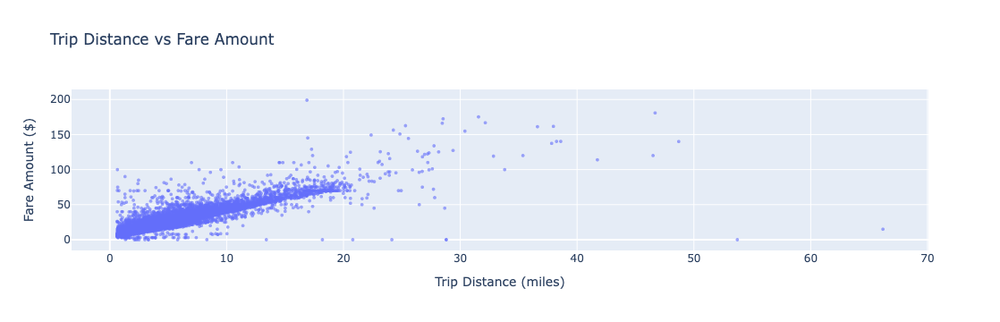

In [61]:
fig=px.scatter(
    df,
    x="trip_distance",
    y="fare_amount",
    title="Trip Distance vs Fare Amount",
    labels={
       "trip_distance":"Trip Distance (miles)",
       "fare_amount":"Fare Amount ($)"
    },
    opacity=0.6
)

fig.update_traces(marker=dict(size=4))
fig.update_layout(
    xaxis=dict(showgrid=True),
    yaxis=dict(showgrid=True)
)
fig.show()

# Output

In [63]:
df.to_csv("output/df.csv",index=False)
numberOfTrips.to_csv("output/numberOfTrips.csv",index=False)
pivotNumberOfTrips.to_csv("output/pivotNumberOfTrips.csv",index=False)
averageByPayment.to_csv("output/averageByPayment.csv",index=False)
tripDistanceDistribution.to_csv("output/tripDistanceDistribution.csv",index=False)
pickup_hotspots.to_csv("output/pickup_hotspots.csv",index=False)
dropoff_hotspots.to_csv("output/dropoff_hotspots.csv",index=False)